Importing necessary packages and loading the dataset

In [3]:
import re
import sys
import numpy as np
import pandas as pd

# plot packages
import seaborn as sns
import matplotlib.pyplot as plt
# setting inline backend for matplotlib
%matplotlib inline

# xgboost algorithm
from xgboost import XGBClassifier

# packages for model development from scikit learn
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# importing packages necessary for preprocessing from natural language toolkit(nltk)
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# importing data
mbti_data = pd.read_csv('../mbti_kaggle.csv')


Setting custom rules to print data.

In [6]:
# print without limitation ;)

# display whole pandas dataframe
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', 80)  # or 199

# remove elipsis from numpy array print
np.set_printoptions(threshold=sys.maxsize)

Previewing few rows of data at top of the dataframe

In [7]:
mbti_data.head(8)

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||http://41.media.tumblr.com/tum...
1,ENTP,'I'm finding the lack of me in these posts very alarming.|||Sex can be borin...
2,INTP,"'Good one _____ https://www.youtube.com/watch?v=fHiGbolFFGw|||Of course, ..."
3,INTJ,"'Dear INTP, I enjoyed our conversation the other day. Esoteric gabbing ab..."
4,ENTJ,'You're fired.|||That's another silly misconception. That approaching is log...
5,INTJ,"'18/37 @.@|||Science is not perfect. No scientist claims that it is, or tha..."
6,INFJ,"'No, I can't draw on my own nails (haha). Those were done by professionals o..."
7,INTJ,'I tend to build up a collection of things on my desktop that i use frequent...


# Dataset Exploration
Now the data has been loaded into a dataframe. The first step would be to explore the dataset and learn about it's properties for proper usage to build the ML model.

In [8]:
mbti_data.shape

(8675, 2)

It is clear there are `8675` rows of data with two features/columns which apparently are posts and the four character long MBTI type of respective person

In [5]:
len(mbti_data.iloc[1,1].split('|||'))

50

Here the posts column in the dataframe has a long string of text separated by `|||` once in a while which separates each post of that person and from above output it is clear that entry of posts contains the excerpt of 50 posts.

In [9]:
mbti_data.isnull().any()

type     False
posts    False
dtype: bool

Also it is clear that there are no missing values in the dataset.

In [7]:
print(np.unique(np.array(mbti_data['type'])))
len(np.unique(np.array(mbti_data['type'])))

['ENFJ' 'ENFP' 'ENTJ' 'ENTP' 'ESFJ' 'ESFP' 'ESTJ' 'ESTP' 'INFJ' 'INFP'
 'INTJ' 'INTP' 'ISFJ' 'ISFP' 'ISTJ' 'ISTP']


16

According to standard Myer-Briggs Type Indicators (MBTI) there are all `16` different personality types present in the dataset.

## Visualization

Now, let's see the total number of posts in the dataset for each of the 16 personality types.

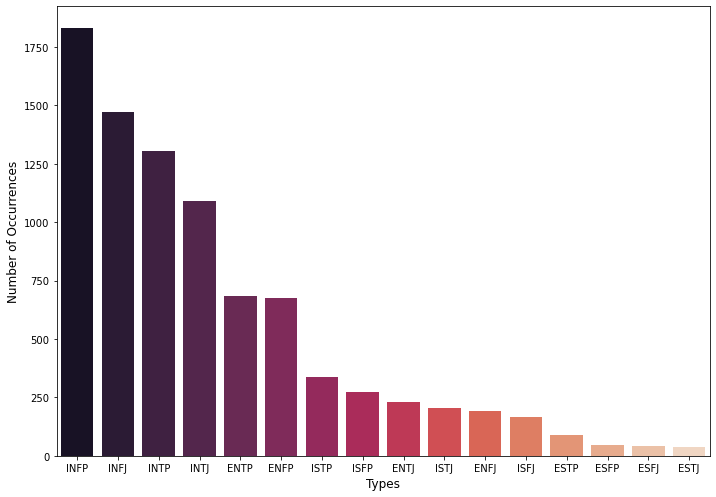

In [8]:
cnt_types = mbti_data['type'].value_counts()

# plt.figure(figsize=(12,4))

fig, ax = plt.subplots(figsize=(11.7, 8.27))
sns.barplot(cnt_types.index, cnt_types.values, palette='rocket', ax=ax)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Types', fontsize=12)
plt.show()



From this visualization it is clear that there are unbalanced posts for different personality types this may hamper the model efficiency. Another astounding fact is that INFP has the highest number of posts while it is the least common personality in real world. Similarly for other occurences too the dataset is almost skewed opposite to the real life scenario. This may cause overfitting.

Text(0.5, 1.0, 'Distribution of length of all posts')

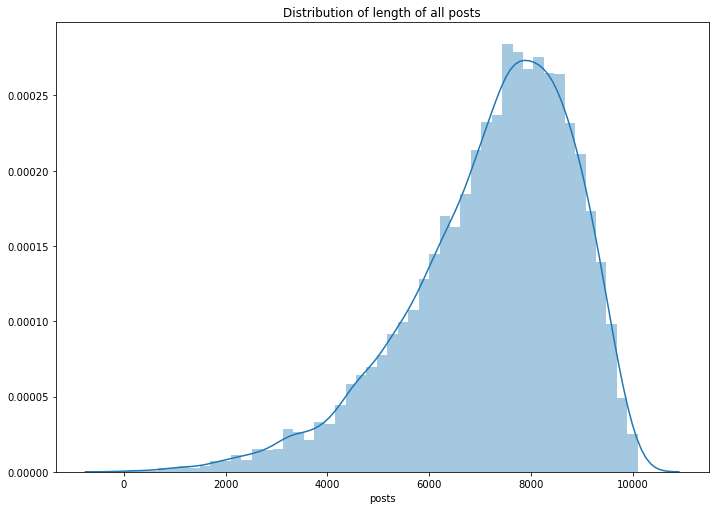

In [9]:
postsLen = mbti_data["posts"].apply(len)
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.distplot(postsLen, ax=ax).set_title("Distribution of length of all posts")

# Implementing Initial naive model

Let's implement a multi-class classifier model for the dataset using XG Boost algorithm. 

## Prepare dataset

### Preprocess posts
The raw posts data contains different unecessary and meaningless texts also some text may misdefine the behaviour of model for which cleansing should be done which involves:
 
 - Removing URLs
 - Remove **MBTI** personality type mentioned in text
 - Remove special characters and numbers i.e keep only alphabet words with minimum of two    characters
 - Lemmatize each word

In [10]:
mbti_types = ['ENFJ' 'ENFP' 'ENTJ' 'ENTP' 'ESFJ' 'ESFP' 'ESTJ' 'ESTP' 'INFJ' 'INFP'
 'INTJ' 'INTP' 'ISFJ' 'ISFP' 'ISTJ' 'ISTP']

# preloading stopwords
stop_words = stopwords.words("english")

# lemmatizer object
lemmatizer = WordNetLemmatizer()


# preprocessor function
def pre_process_posts(text):
    # remove urls
    posts = re.sub("http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+", " ", text)
    #remove all other characters except alphabets
    posts = re.sub("[^a-zA-Z]", " ", posts)
    
    # remove MBTI types mentioned in posts
    for mbti_type in mbti_types:
        posts = posts.replace(mbti_type, "")
    
    posts = re.sub(" +", " ", posts).lower()
    
    # converting inflected words into base form i.e lemmatizing
    posts = " ".join([lemmatizer.lemmatize(word) for word in posts.split(' ') if word not in stop_words])
    return posts  

### Tokenize text

In [11]:
# tokenization function
def tokenize(text):
    tokens = [word for word in word_tokenize(text) if len(word) > 1]
    return tokens

Let's convert plain texts post into TF/IDF vector representation to be fed to the model.

In [12]:
tokenized_stop_words = word_tokenize(' '.join(stopwords.words('english')))

tfidf_vectorizer = TfidfVectorizer(use_idf=True, stop_words=tokenized_stop_words, preprocessor=pre_process_posts, tokenizer=tokenize, token_pattern=None)
fitted_vector = tfidf_vectorizer.fit(mbti_data["posts"])
X = fitted_vector.transform(mbti_data["posts"])
df = pd.DataFrame(X[0].T.todense(), index=tfidf_vectorizer.get_feature_names(), columns=["tfidf"]) 
df.sort_values(by=["tfidf"],ascending=False)

,tfidf
banned,0.444627
backyard,0.158291
moderation,0.156839
artist,0.136246
diary,0.133990
sportscenter,0.121300
wellbrutin,0.121300
game,0.112474
thundering,0.112332
grumbling,0.112332


In [42]:
X.shape

(8675, 88738)

encoding personality types

In [34]:
enc = LabelEncoder()
Y = enc.fit_transform(mbti_data["type"])
# Y

Splitting data to train and test sets.

In [35]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(5812, 88738) (2863, 88738) (5812,) (2863,)


Training the model

In [36]:
model = XGBClassifier(use_label_encoder=False)
model.fit(X_train, Y_train)

[22:23:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

Making predictions

In [37]:
Y_pred = model.predict(X_test)
accuracy = accuracy_score(Y_test, Y_pred)
accuracy

0.6531610199091862

Here, we have generated a decent accuray with a multiclass classifier. However it is not much efficient and overlapping of similar types affects the prediction. Also individual dimension of personality is not considered.

# Implementation with four binary classifiers

To deal with the problem and situation described earlier considering the nature of MBTI personality type which has major four dimensions of personality with two values each resulting one from each of them to the personality code. Which clearly suggests we can create four binary classifiers to calculate trait from each dimension which on combination gives the actual personality code.

### Binarize/Encode MBTI to a vector

At first let's create utility functions for the task.

In [46]:
value_per_trait = {'I':0, 'E':1, 'N':0, 'S':1, 'F':0, 'T':1, 'J':0, 'P':1}
dimension_traits = [{0:'I', 1:'E'}, {0:'N', 1:'S'}, {0:'F', 1:'T'}, {0:'J', 1:'P'}]

def convert_mbti_to_binary(personality):
    '''Calculate binary vector for MBTI personality string'''
    return [value_per_trait[t] for t in personality]

def translate_binary_to_mbti(vector):
    '''Map binary vector to respective MBTI personality string'''
    p = ""
    for d, t in enumerate(vector):
        p += dimension_traits[d][t]
    return p

# test
# d = mbti_data.head(5)
# np.array([convert_mbti_to_binary(code) for code in d.type])
# print(translate_binary_to_mbti(np.array([0, 0, 0, 0])))

Now convert the personality of whole dataset to binary vectors.

In [45]:
binarized_personalities = []

for personality in mbti_data["type"]:
    binarized_personalities.append(convert_mbti_to_binary(personality))

binarized_personalities = np.array(binarized_personalities)
    
print('Binarized first personality: ', binarized_personalities[0, :])
print('Binary to text: ', translate_binary_to_mbti(binarized_personalities[0, :]))
# binarized_personalities

Binarized first personality:  [0 0 0 0]
Binary to text:  INFJ


### Train models

In [57]:
dimensions = [ 
                ("energy", "IE: Introversion (I) / Extroversion (E)"), 
                ("information", "NS: Intuition (N) / Sensing (S)"),
                ("decision", "FT: Feeling (F) / Thinking (T)"),
                ("organization", "JP: Judging (J) / Perceiving (P)")
            ]
models = {}

for i in range(len(dimensions)):
    print(f"Training model for { dimensions[i][0]} dimension..........")
    
    # personality type binary for current dimension only
    Y = binarized_personalities[:,i]
    
    # split data to train and test splits
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=7)
    
    # fit model with training data
    model = XGBClassifier(use_label_encoder=False)
    model.fit(X_train, Y_train)
    
    # add model to models dictionary
    models[dimensions[i][0]] = model
    
    # make prediction for test data
    Y_pred = model.predict(X_test)
    Y_pred = [round(val) for val in Y_pred]
    # evaluate prediction accuracy
    accuracy = accuracy_score(Y_test, Y_pred)
    print(f"* {dimensions[i][1]} Accuracy: {accuracy * 100.0}")

Training model for energy dimension..........


/home/z3ngis/.local/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:59:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
* IE: Introversion (I) / Extroversion (E) Accuracy: 86.3080684596577
Training model for information dimension..........
[11:59:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
* NS: Intuition (N) / Sensing (S) Accuracy: 89.83583653510304
Training model for decision dimension..........
[12:00:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
* FT: Feeling 

In [58]:
models

{'energy': XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.300000012, max_delta_step=0, max_depth=6,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
               reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
               tree_method='exact', validate_parameters=1, verbosity=None),
 'information': XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.300000012, max_delta_step=0, max_depth=6,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimat